In [1]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [2]:
classFile  = r"C:\Users\dhika\model\coco_class_labels.txt"

In [3]:
with open(classFile) as fp:
    labels = fp.read().split("\n")

print(labels)

['unlabeled', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'street sign', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'hat', 'backpack', 'umbrella', 'shoe', 'eye glasses', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket', 'bottle', 'plate', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'mirror', 'dining table', 'window', 'desk', 'toilet', 'door', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'blender', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush', 'hair brush', '']


In [4]:
modelFile  = os.path.join(r"C:\Users\dhika\model\frozen_inference_graph.pb")
configFile = os.path.join(r"C:\Users\dhika\model\ssd_mobilenet_v2_coco_2018_03_29.pbtxt")

In [5]:
net_model= cv2.dnn.readNetFromTensorflow(modelFile, configFile)

In [6]:
def detect_objects(net, im, dim = 300):

    blob = cv2.dnn.blobFromImage(im, 1.0, size=(dim, dim), mean=(0, 0, 0), swapRB=True, crop=False)

    net_model.setInput(blob)

    objects = net_model.forward()
    return objects

In [7]:
def display_text(im, text, x, y):
    
    FONTFACE = cv2.FONT_HERSHEY_SIMPLEX
    FONT_SCALE = 0.7
    THICKNESS = 1

    textSize = cv2.getTextSize(text, FONTFACE, FONT_SCALE, THICKNESS)
    dim = textSize[0]
    baseline = textSize[1]


    cv2.rectangle(
        im,
        (x, y - dim[1] - baseline),
        (x + dim[0], y + baseline),
        (0, 0, 255),
        cv2.FILLED,
    )

    cv2.putText(
        im,
        text,
        (x, y - 5),
        FONTFACE,
        FONT_SCALE,
        (0, 255, 255),
        THICKNESS,
        cv2.LINE_AA,
    )

In [8]:
def update_car_count(car_count, labels, classId):
    if labels[classId] == 'car':
        car_count += 1
    return car_count

def update_motor_count(motor_count, labels, classId):
    if labels[classId] == 'motorcycle':
        motor_count += 1
    return motor_count


def display_objects(im, objects, threshold=0.30):
    rows = im.shape[0]
    cols = im.shape[1]
    object_count=0
    car_count = 0
    motor_count = 0
    object_labels=set()


    for i in range(objects.shape[2]):
        classId = int(objects[0, 0, i, 1])
        score = float(objects[0, 0, i, 2])

        x = int(objects[0, 0, i, 3] * cols)
        y = int(objects[0, 0, i, 4] * rows)
        w = int(objects[0, 0, i, 5] * cols - x)
        h = int(objects[0, 0, i, 6] * rows - y)

        if score > threshold:
            object_count += 1
            object_kind = labels[classId]
            object_labels.add(object_kind)    

            if labels[classId] == 'car':
                car_count += 1

            if labels[classId] == 'motorcycle':
                motor_count += 1
                cv2.rectangle(im, (5, 120), (175, 90), (0, 0, 0), -1)
                cv2.putText(im,"Violators Detected: {}".format(motor_count),(10,110),cv2.FONT_HERSHEY_SIMPLEX,0.5,(0,0,255),2)

            display_text(im, "{}".format(labels[classId]), x, y)
            cv2.rectangle(im, (x, y), (x + w, y + h), (0, 0, 255), 2)

    traffic_status = "Normal" if car_count < 40 else "Traffic"

    cv2.rectangle(im, (5, 0), (175, 90), (0, 0, 0), -1)
    cv2.putText(im,"Total Objects: {}".format(object_count),(10,20),cv2.FONT_HERSHEY_SIMPLEX,0.5,(255,0,0),2)
    cv2.rectangle(im, (5, 30), (400, 90), (0, 0, 0), -1)
    cv2.putText(im, "Total Car Detected: {} - Traffic Status: {}".format(car_count, traffic_status), (10, 50), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 255), 2)
    cv2.rectangle(im, (5, 60), (400, 90), (0, 0, 0), -1)
    cv2.putText(im, "Kind of Object Detected: {}".format(", ".join(object_labels)), (10, 80), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 2)

    mp_img = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(30, 10))
    plt.axis('off')
    plt.imshow(mp_img)
    plt.show()

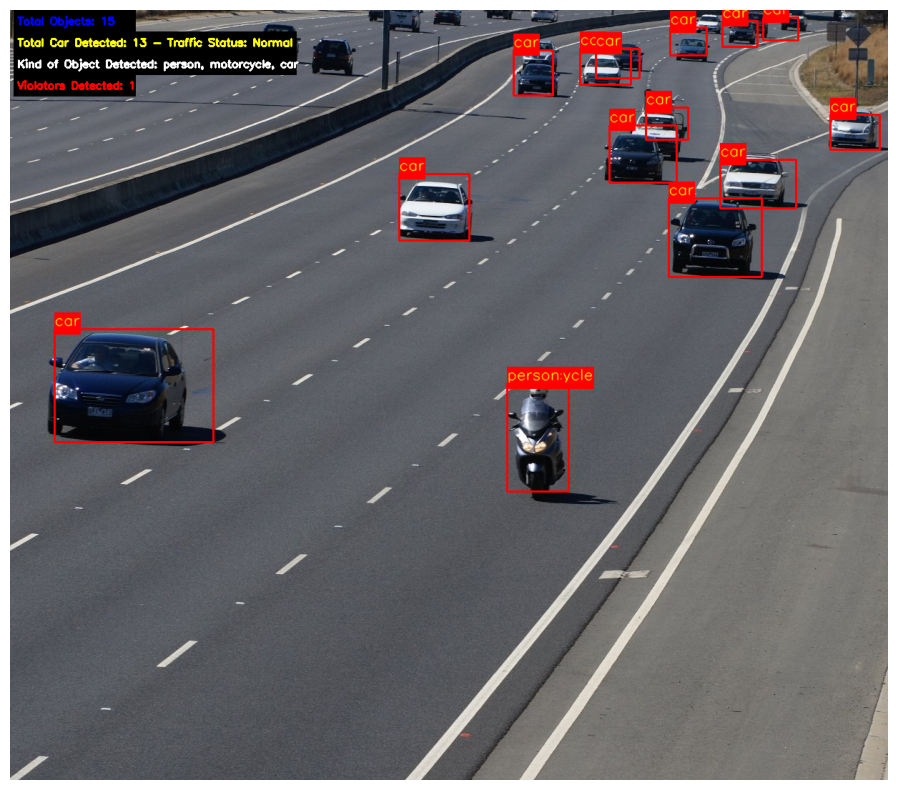

In [11]:
im = cv2.imread(r"C:\Users\dhika\test_asset\highway_motor.jpg")
objects = detect_objects(net_model, im)
display_objects(im, objects)

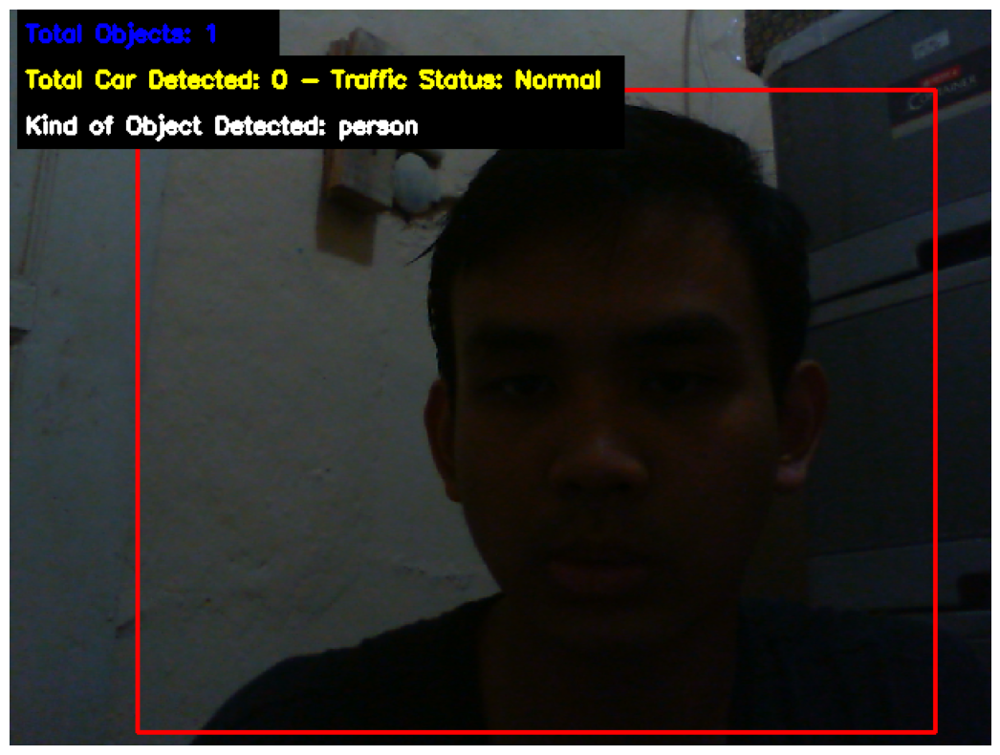

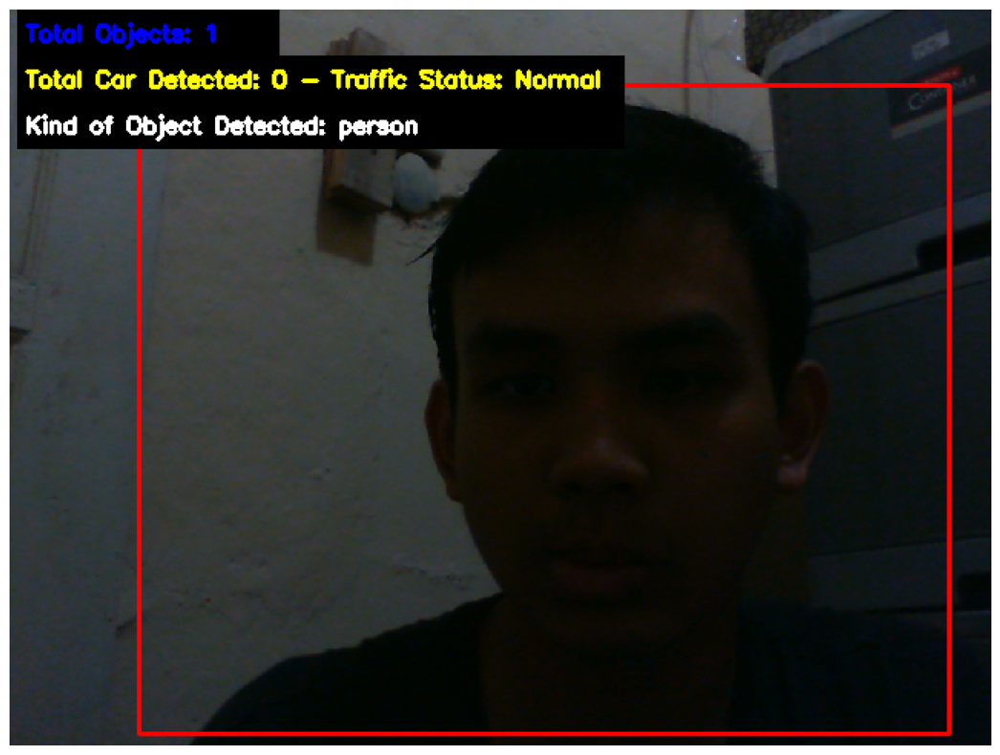

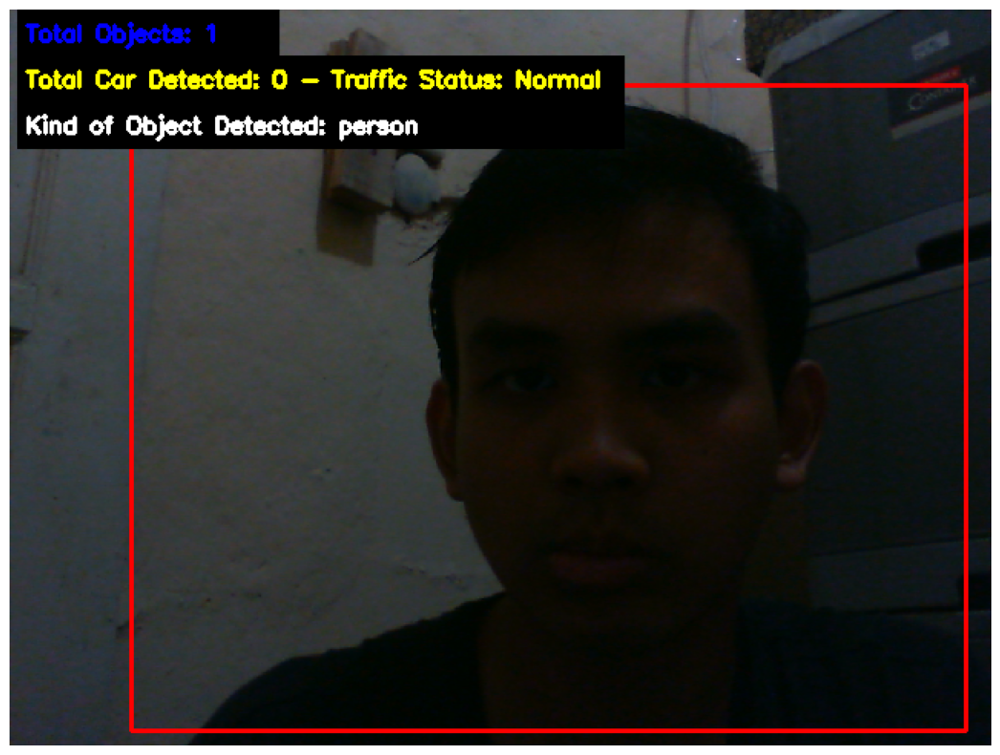

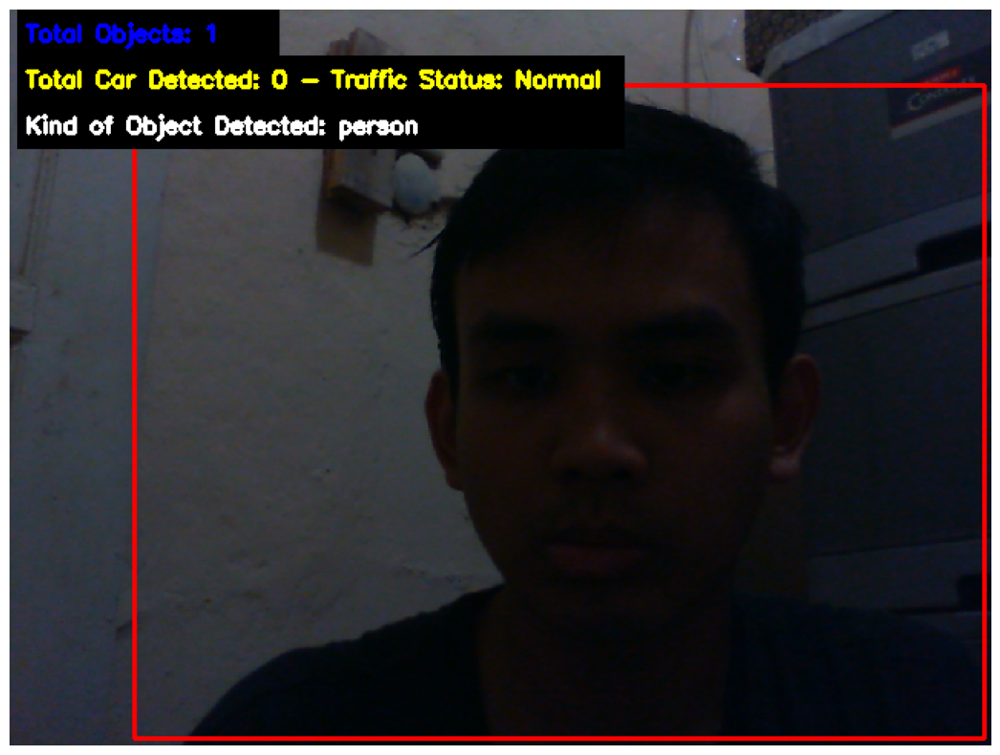

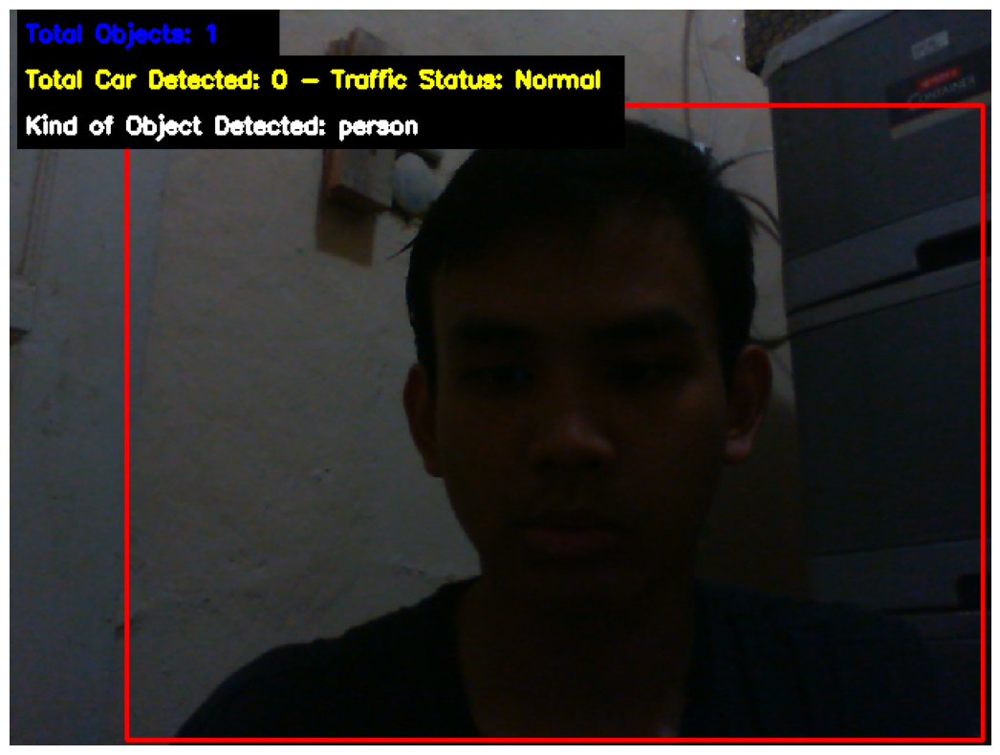

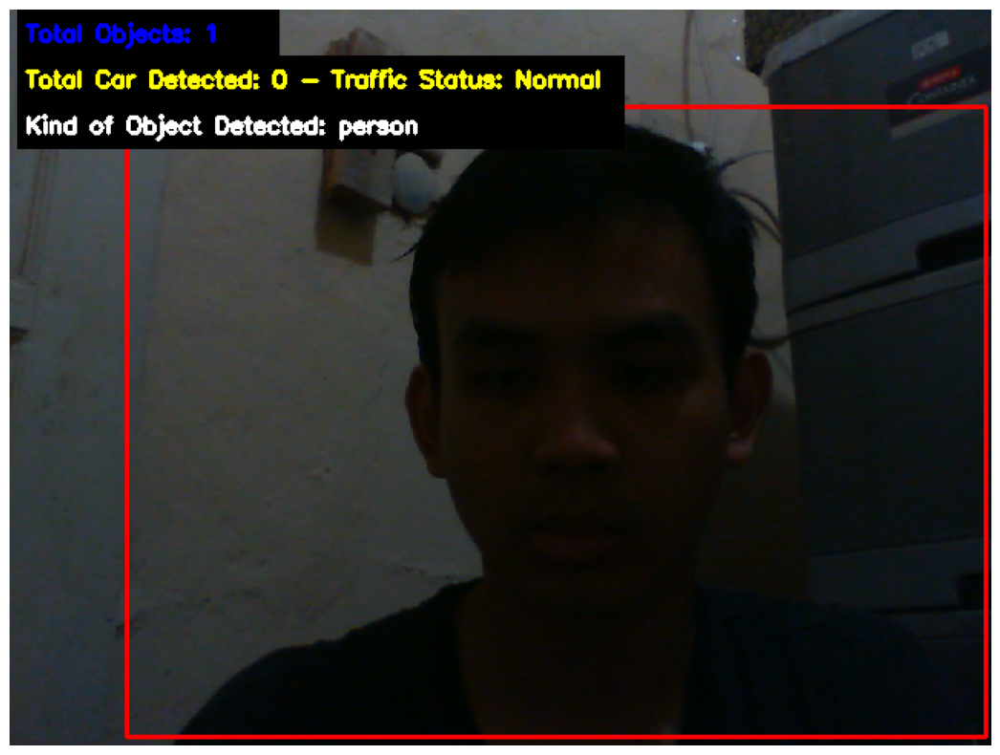

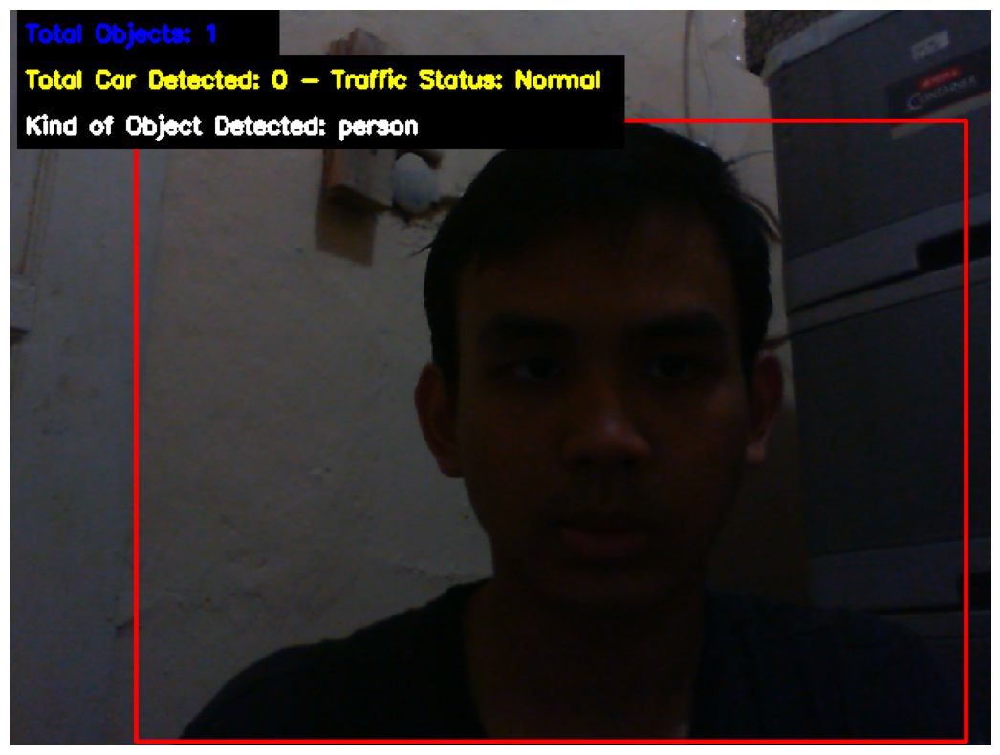

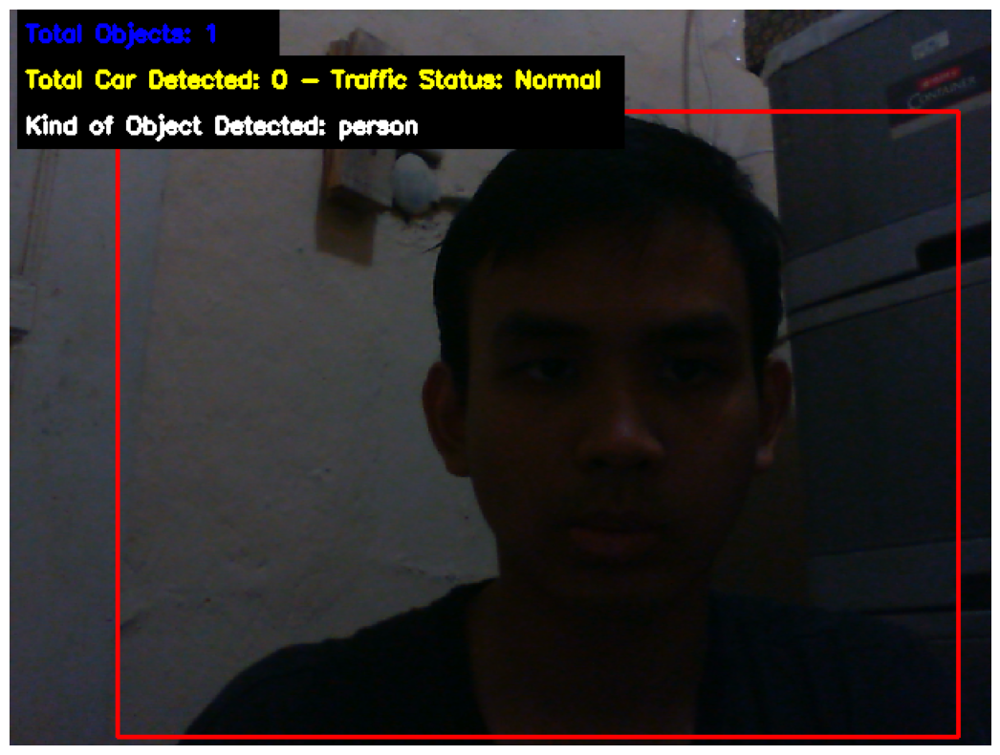

In [10]:
import cv2
import numpy as np

net_model = net_model

cap = cv2.VideoCapture(0)

while True:
    ret, im = cap.read()

    objects = detect_objects(net_model, im)

    display_objects(im, objects)

    cv2.imshow('object detection', im)

    if cv2.waitKey(25) & 0xFF == ord('q'):
        break

cap.release()
cv2.destroyAllWindows()

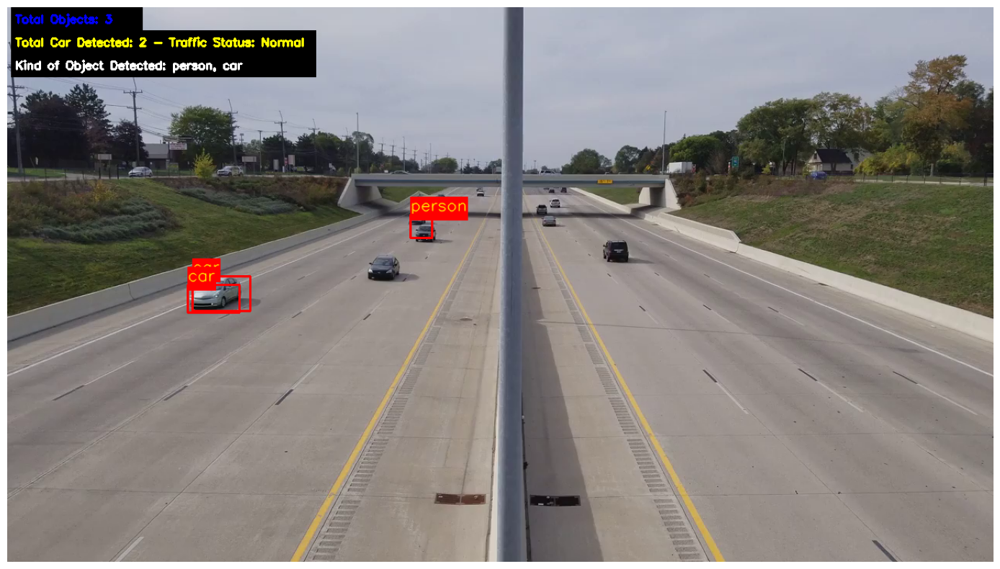

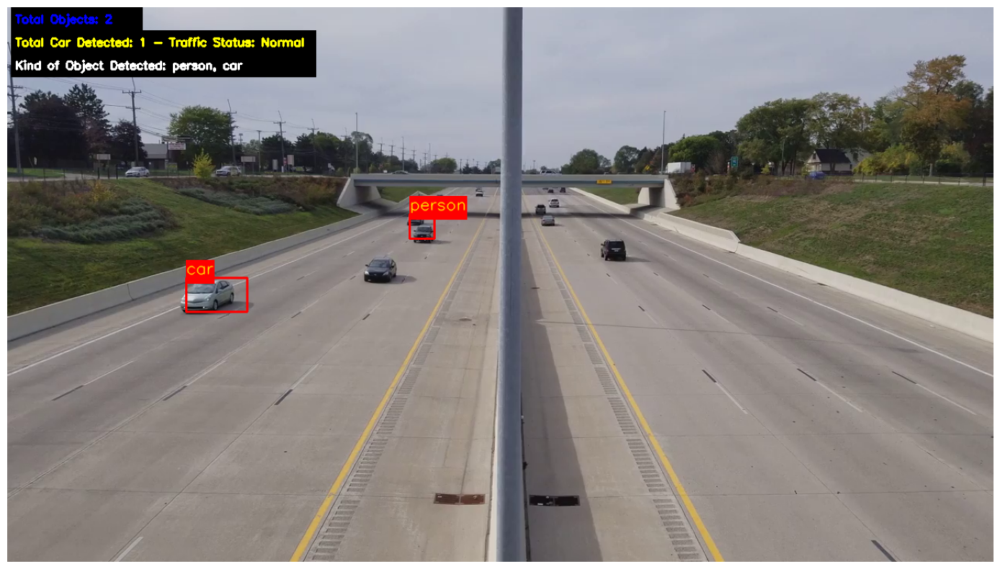

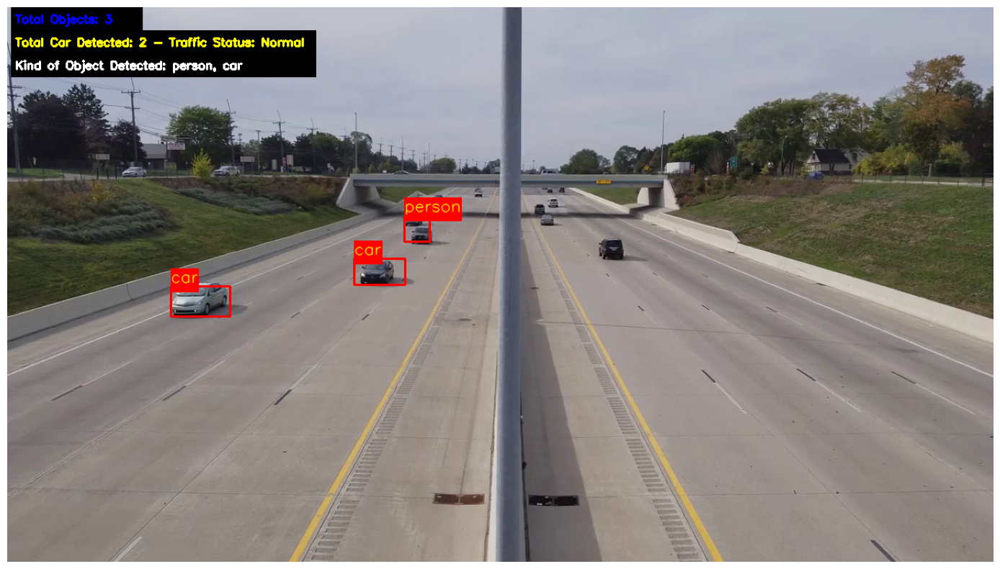

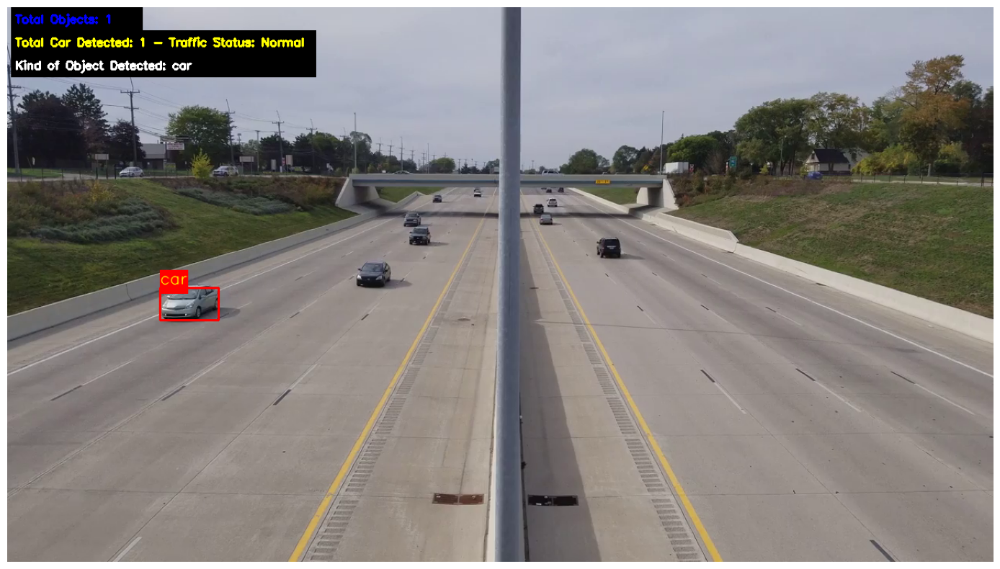

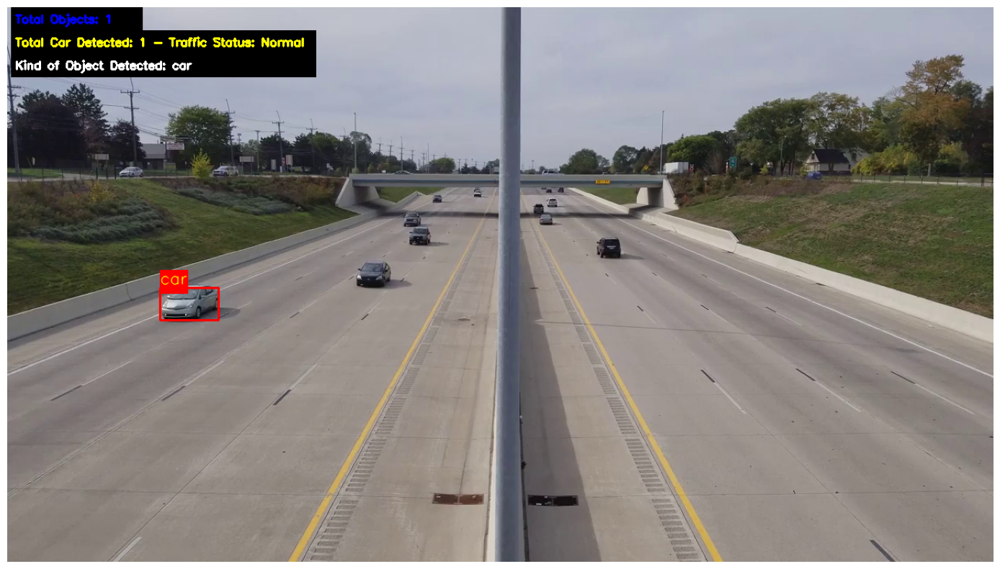

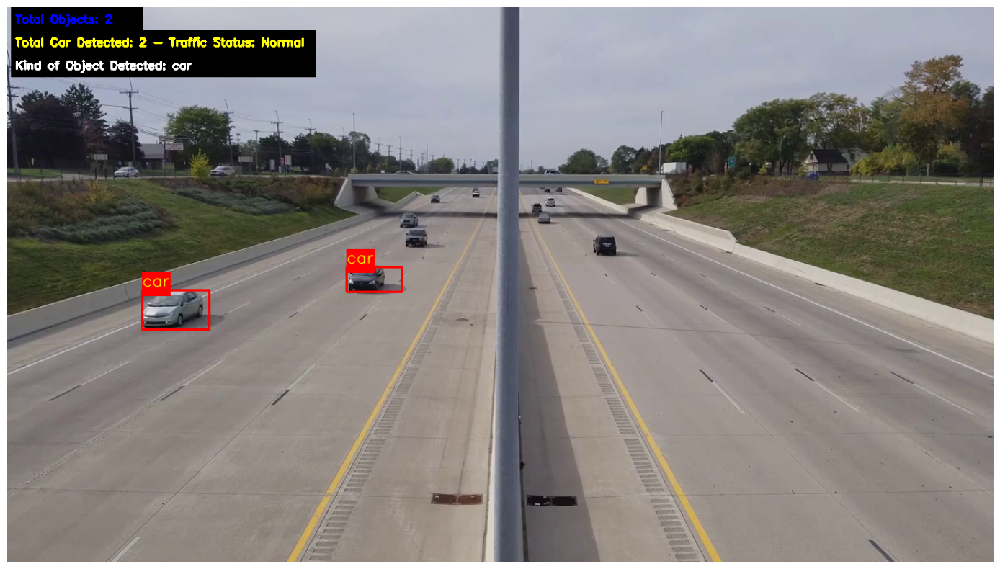

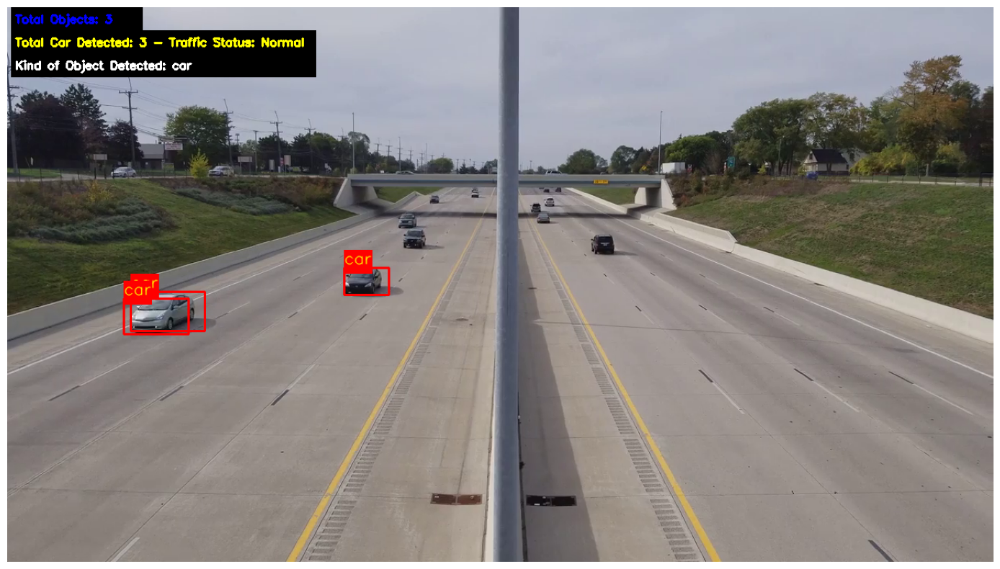

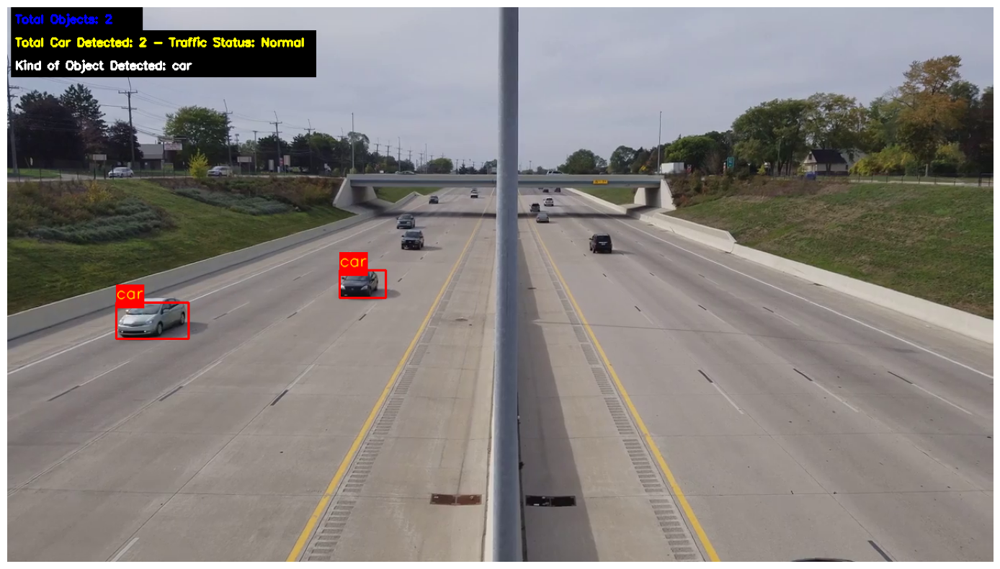

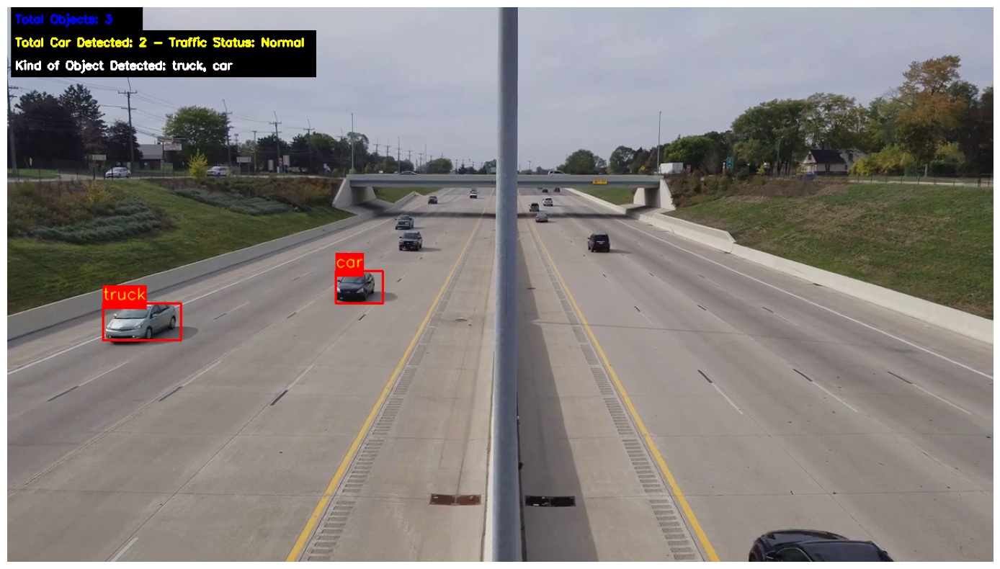

In [12]:
net_model = net_model

cap = cv2.VideoCapture(r"C:\Users\dhika\test_asset\yt1s.com - 4K Video of Highway Traffic_v720P.mp4")

while True:
    ret, im = cap.read()
    
    if not ret:
        break

    objects = detect_objects(net_model, im)
    mp_img = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)

    display_objects(im, objects)

    cv2.imshow('object detection', im)

    if cv2.waitKey(25) & 0xFF == ord('q'):
        break

cap.release()
cv2.destroyAllWindows()